In [2]:
#!pip install pandas
#!pip install polars
#!pip install matplotlib
#!pip install seaborn
#!pip install datasets
#!pip install transformers
#!pip install protobuf
#!pip install scikit-learn
#!pip install nltk
#!pip install evaluate
#!pip install plotly

In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
from datasets import load_dataset, Dataset, load_metric, load_from_disk
from transformers import pipeline, AutoTokenizer, Trainer, TrainingArguments, AutoModelForSequenceClassification, AutoModel
from transformers import DataCollatorWithPadding, AdamW, get_linear_schedule_with_warmup, EarlyStoppingCallback
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from collections import Counter
from tqdm import tqdm
from tqdm.notebook import tqdm as tqdmn
import matplotlib.pyplot as plt
import seaborn as sns
import evaluate
import textwrap

2024-10-16 23:43:06.354383: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-16 23:43:06.354440: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-16 23:43:06.355661: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-16 23:43:06.362143: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-16 23:43:07.235389: W tensorflow/compiler/tf2

In [4]:
final_df = pd.read_pickle('final_dataset_sent.pkl')

In [5]:
# Split into train and test sets (90/10)
train_df, test_df = train_test_split(final_df, test_size=0.1, random_state=42)

In [6]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2")
embeddings = model.encode(
    sentences=train_df['review'].tolist(),
    show_progress_bar=True,
    normalize_embeddings=True)

#df_embedding = pd.DataFrame(embeddings)

.gitattributes:   0%|          | 0.00/744 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.73k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

model.onnx:   0%|          | 0.00/90.4M [00:00<?, ?B/s]

model_O1.onnx:   0%|          | 0.00/90.4M [00:00<?, ?B/s]

model_O2.onnx:   0%|          | 0.00/90.3M [00:00<?, ?B/s]

model_O3.onnx:   0%|          | 0.00/90.3M [00:00<?, ?B/s]

model_O4.onnx:   0%|          | 0.00/45.2M [00:00<?, ?B/s]

model_qint8_arm64.onnx:   0%|          | 0.00/23.0M [00:00<?, ?B/s]

model_qint8_avx512.onnx:   0%|          | 0.00/23.0M [00:00<?, ?B/s]

model_qint8_avx512_vnni.onnx:   0%|          | 0.00/23.0M [00:00<?, ?B/s]

model_quint8_avx2.onnx:   0%|          | 0.00/23.0M [00:00<?, ?B/s]

openvino_model.bin:   0%|          | 0.00/90.3M [00:00<?, ?B/s]

openvino/openvino_model.xml:   0%|          | 0.00/211k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/314 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

Batches:   0%|          | 0/2867 [00:00<?, ?it/s]

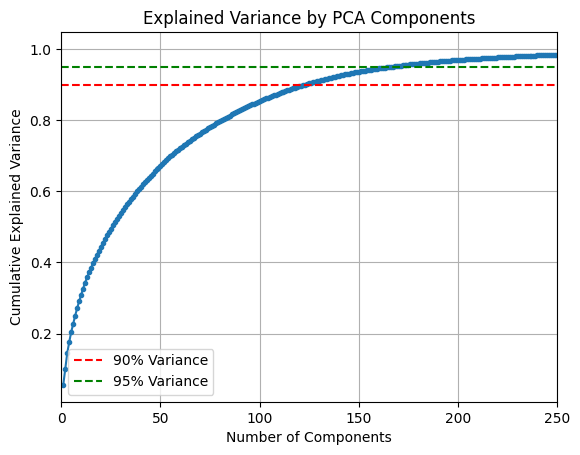

124 components explain at least 90% of the variance.
167 components explain at least 95% of the variance.


In [6]:
pca = PCA()
pca.fit(embeddings)

# Plot cumulative explained variance
cumulative_variance = pca.explained_variance_ratio_.cumsum()

plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', markersize=3)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA Components')
plt.grid(True)

# Zoom in on the region of interest (up to 200 components for instance)
plt.xlim(0, 250)

# Add horizontal lines at 90% and 95% variance
plt.axhline(y=0.90, color='r', linestyle='--', label="90% Variance")
plt.axhline(y=0.95, color='g', linestyle='--', label="95% Variance")

plt.legend()
plt.show()

# Print the number of components needed to explain 90% and 95% variance
for i, cum_var in enumerate(cumulative_variance):
    if cum_var >= 0.90:
        print(f"{i + 1} components explain at least 90% of the variance.")
        break
for i, cum_var in enumerate(cumulative_variance):
    if cum_var >= 0.95:
        print(f"{i + 1} components explain at least 95% of the variance.")
        break


In [7]:
# Perform PCA to reduce dimensionality
pca = PCA(n_components=124) # 150 choosen based on elbow method analyzing the explained variance
reduced_embeddings = pca.fit_transform(embeddings)

In [8]:
# Apply KMeans clustering
kmeans = KMeans(n_clusters=4, n_init=100, max_iter=600, random_state=42, verbose=0)
clusters = kmeans.fit_predict(reduced_embeddings)

In [11]:
# Create embeddings for the whole dataset
all_embeddings = model.encode(
    sentences=final_df['review'].tolist(),
    show_progress_bar=True,
    normalize_embeddings=True)

# Perform PCA to reduce dimensionality
reduced_all_embeddings = pca.fit_transform(all_embeddings)

# Apply KMeans clustering
clusters_all = kmeans.fit_predict(reduced_all_embeddings)

# Define the human-readable labels for each cluster
cluster_labels = {
    0: "Ebook Readers",
    1: "Beauty",
    2: "Electronics",
    3: "Office",
}

Batches:   0%|          | 0/3185 [00:00<?, ?it/s]

In [16]:
# Add the human-readable cluster labels to 'final_df'
final_df['cluster'] = [cluster_labels[cluster] for cluster in clusters_all]

In [18]:
final_df.sample(3)

,title,text,review,rating,sentiment,sentiment_score,id,name,categories,labels,cluster
37883,not new as ordered,I received a refurbushed product instead of ne...,not new as ordered. I received a refurbushed p...,3.0,NEGATIVE,-0.6530,B00006K0X1,Philips Norelco 8825XL Spectra Rechargeable Co...,[],0,Beauty
69023,Outstanding quality; great value,My 2nd Fire. Great picture quality. Easy to us...,Outstanding quality; great value. My 2nd Fire....,5.0,POSITIVE,0.9559,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...","Electronics,iPad & Tablets,All Tablets,Fire Ta...",2,Ebook Readers
8413,not that great,The bristles are too wide to allow you get int...,not that great. The bristles are too wide to a...,2.0,NEUTRAL,-0.2008,B07NQGZRP5,"Ionic Hair Straightener Brush, LEWOTE 2 in1 MC...",[],1,Office


In [19]:
final_df.to_pickle('final_dataset_clust.pkl')

In [44]:
import nltk
from nltk.corpus import stopwords

# Download stopwords if you haven't already
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# Function to remove stopwords from a text
def remove_stopwords(text):
    return [word for word in text.split() if word.lower() not in stop_words]

### Qualitative Analysis: Interpret the Cluster Assignments
df = pd.DataFrame({'text': train_df['review'].tolist(), 'cluster': clusters})

# Apply this function to each cluster's text data
for cluster_num in range(4):
    cluster_texts = df[df['cluster'] == cluster_num]['text'].apply(remove_stopwords)
    words = ' '.join([' '.join(text) for text in cluster_texts]).split()
    common_words = Counter(words).most_common(10)
    print(f'Cluster {cluster_num}:', common_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Cluster 0: [('/><br', 8129), ('one', 7658), ('would', 6578), ('get', 6339), ('like', 5746), ('use', 5697), ('work', 5338), ('good', 4097), ('it.', 4037), ('product', 3606)]
Cluster 1: [('Stars.', 6200), ('Five', 2850), ('Three', 2420), ('One', 977), ('Star.', 951), ('Four', 491), ('Two', 465), ('great', 448), ('good', 436), ('Great', 423)]
Cluster 2: [('Great', 6950), ('great', 5022), ('good', 3852), ('love', 3663), ('use', 3388), ('like', 3267), ('it.', 2986), ('easy', 2795), ('tablet', 2763), ('one', 2502)]
Cluster 3: [('like', 6635), ('hair', 5904), ('use', 3922), ('would', 3436), ('good', 3366), ('get', 3229), ('product', 3168), ('one', 3023), ('really', 2877), ('/><br', 2456)]


In [45]:
### Cluster Centroid Interpretation
cluster_centroids = kmeans.cluster_centers_
print(cluster_centroids)  # These are the centroids for each cluster

[[-8.43028128e-02  1.65576294e-01  6.83097243e-02 -8.57781153e-03
  -1.85337141e-02  6.06691558e-03  1.51810115e-02  1.56618878e-02
   8.23734701e-03  3.93732870e-03 -3.20222159e-03  2.27937475e-03
  -3.50599387e-03 -5.32937143e-03 -7.72101013e-03  5.87996189e-03
  -1.38145860e-03  5.32503799e-03  9.88645945e-04  8.21978843e-04
   5.88368764e-03 -2.04688194e-03 -1.23094663e-03  1.90264182e-04
  -2.65844632e-03  8.88830691e-04 -4.34716139e-03 -3.00721801e-03
  -4.00722318e-04 -1.20495050e-03  4.18979255e-03 -4.83138021e-04
  -9.01304826e-04 -6.26923807e-04  1.62604882e-03 -1.31553237e-03
  -1.53837304e-04  5.65906754e-04  2.89046369e-03  5.32368850e-03
  -1.24139944e-04  1.95932039e-03 -9.05020512e-04 -2.07706913e-03
   2.25748355e-03 -1.09073793e-04  2.29730178e-03 -1.39942381e-03
   8.44035094e-05 -8.39046785e-04  3.00971395e-03 -1.22099777e-03
  -5.19269262e-04 -2.01828103e-03  6.67765707e-05 -2.40402902e-03
   6.90542918e-04  5.48537791e-05 -4.57609858e-04  2.15702550e-03
   1.63297

In [51]:
dbi = davies_bouldin_score(reduced_embeddings, clusters)
chs = calinski_harabasz_score(reduced_embeddings, clusters)
silhouette_avg = silhouette_score(reduced_embeddings, clusters)

# Similarity between clusters by comparing the distance between clusters and the size of each cluster.
# Lower values are better, ideally close to 0; they indicate more compact, well-separated clusters.
print(f'Davies-Bouldin Index: {dbi:.2f}')
# Evaluates the separation between clusters relative to the dispersion within clusters.
# A higher value means better-defined clusters.
print(f'Calinski-Harabasz Index: {chs:.2f}')
# How similar each point is to its own cluster compared to other clusters.
# It ranges from -1 to 1, with higher values indicating better-defined clusters.
print(f'Silhouette Score: {silhouette_avg:.4f}')

# Previous:
# Davies-Bouldin Index: 3.93
# Calinski-Harabasz Index: 3342.18
# Silhouette Score: 0.0452

Davies-Bouldin Index: 3.93
Calinski-Harabasz Index: 3342.18
Silhouette Score: 0.0452


In [47]:
import plotly.express as px

# Apply PCA to reduce to 3 components for visualization
pca_3d = PCA(n_components=3)
reduced_embeddings_3d = pca_3d.fit_transform(embeddings)

# Create a DataFrame for the embeddings and clusters
df = pd.DataFrame({
    'PCA Dimension 1': reduced_embeddings_3d[:, 0],
    'PCA Dimension 2': reduced_embeddings_3d[:, 1],
    'PCA Dimension 3': reduced_embeddings_3d[:, 2],
    'Cluster': clusters
})

# Create the interactive 3D scatter plot
fig = px.scatter_3d(
    df,
    x='PCA Dimension 1',
    y='PCA Dimension 2',
    z='PCA Dimension 3',
    color='Cluster',
    color_continuous_scale='Viridis',  # Color scale
    title='PCA-Reduced Embeddings with KMeans Clusters (Interactive 3D)')

fig.show()

In [48]:
# Assign a label to each cluster after inspecting their contents
cluster_labels = {
    0: "Ebook Readers",
    1: "Beauty",
    2: "Electronics",
    3: "Office",
}

### Test on New Data
new_reviews  = test_df['review'].sample(5).tolist()
# Get embeddings for new reviews
new_embeddings = model.encode(new_reviews, normalize_embeddings=True, show_progress_bar=True)
new_reduced_embeddings = pca.transform(new_embeddings)
new_clusters = kmeans.predict(new_reduced_embeddings)
# Map cluster IDs to human-readable labels
new_cluster_labels = [cluster_labels[cluster] for cluster in new_clusters]

# Sample new reviews and their predicted cluster labels
for review, label in zip(new_reviews, new_cluster_labels):
    print(textwrap.fill(f"TEXT: {review}\nCLUSTER: {label}", width=80))
    print("-"*80)  # Separator for better readability

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

TEXT: Piece of expensively overpriced crap. Piece of crap. Lenovo doesnt support
it and the SELLER doesnt reply to requests for help. Calling Amazon about this.
CLUSTER: Ebook Readers
--------------------------------------------------------------------------------
TEXT: I've tried LOTs and I love these. I've tried lots of shampoos and
conditioners, cheap and expensive over the years -- and I've finally found my
favorite! I would like to order form a consultant but they take $7+ for shipping
-- in comes amazon to the rescue! I have long, wavy, and slightly frizzy brown
hair. My head itches with most cheaper shampoos within a day or so of using- but
with Lysere I can go ~5 days between washes with no problems. The smell is
gentle and not "perfumy" so if you want to smell like a "gain" commercial - this
isn't the product for you. Its like a gentle lemon smell that is almost
imperceptible after drying. CLUSTER: Office
------------------------------------------------------------------------

Calculating Elbow and Silhouette scores:   0%|          | 0/8 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

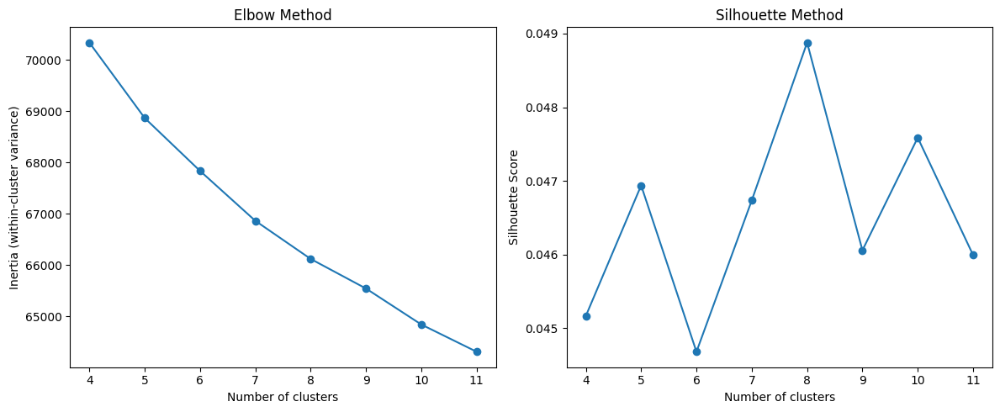

In [15]:
# Sample a smaller subset of the data
sample_size = train_df.shape[0]*0.5
indices = np.random.choice(reduced_embeddings.shape[0], sample_size, replace=False)
sampled_embeddings = reduced_embeddings[indices]

# Initialize lists for storing inertia and silhouette scores
inertia = []
silhouette_scores = []

# Calculate both Elbow (inertia) and Silhouette scores in one loop
for k in tqdmn(range(4, 12), desc="Calculating Elbow and Silhouette scores"):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(sampled_embeddings)
    
    # Store inertia (for Elbow Method)
    inertia.append(kmeans.inertia_)
    
    # Store silhouette score
    silhouette_avg = silhouette_score(sampled_embeddings, cluster_labels, n_jobs=-1)
    silhouette_scores.append(silhouette_avg)

# Create two subplots: one for Elbow Method, one for Silhouette Method
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Plot Elbow Method
ax[0].plot(range(4, 12), inertia, marker='o')
ax[0].set_xlabel('Number of clusters')
ax[0].set_ylabel('Inertia (within-cluster variance)')
ax[0].set_title('Elbow Method')

# Plot Silhouette Method
ax[1].plot(range(4, 12), silhouette_scores, marker='o')
ax[1].set_xlabel('Number of clusters')
ax[1].set_ylabel('Silhouette Score')
ax[1].set_title('Silhouette Method')

# Display the plots
plt.tight_layout()
plt.show()
